#uploading data set

In [1]:
pip install nilearn

  Obtaining dependency information for nilearn from https://files.pythonhosted.org/packages/4c/f9/3fa0d8d8eb8a19b0d6a4ad74bcfb617c302a2e7544e8ae752192c9ca7fa8/nilearn-0.10.4-py3-none-any.whl.metadata
  Obtaining dependency information for nibabel>=4.0.0 from https://files.pythonhosted.org/packages/77/3f/ce43b8c2ccc4a7913a87c4d425aaf0080ea3abf947587e47dc2025981a17/nibabel-5.2.1-py3-none-any.whl.metadata
   ---------------------------------------- 0.0/10.4 MB ? eta -:--:--
   ---------------------------------------- 0.1/10.4 MB 2.0 MB/s eta 0:00:06
   - -------------------------------------- 0.3/10.4 MB 4.3 MB/s eta 0:00:03
   -- ------------------------------------- 0.7/10.4 MB 6.6 MB/s eta 0:00:02
   ---- ----------------------------------- 1.3/10.4 MB 8.9 MB/s eta 0:00:02
   ---------- ----------------------------- 2.8/10.4 MB 14.8 MB/s eta 0:00:01
   ----------------- ---------------------- 4.4/10.4 MB 20.2 MB/s eta 0:00:01
   ------------------- -------------------- 5.0/10.4 MB 18.9

DEPRECATION: Loading egg at c:\users\ahmad\anaconda3\lib\site-packages\sqgturb-0.1-py3.11.egg is deprecated. pip 23.3 will enforce this behaviour change. A possible replacement is to use pip for package installation..


In [2]:
from google.colab import files
import numpy as np

# Step 1: Upload the file
uploaded = files.upload()

# Step 2: Load the file
for filename in uploaded.keys():
    if filename.endswith('.npy'):
        data = np.load(filename)
        print(data)


ModuleNotFoundError: No module named 'google.colab'

In [ ]:
from google.colab import files
import numpy as np

# Step 1: Upload the file
uploaded = files.upload()

# Step 2: Load the file
for filename in uploaded.keys():
    if filename.endswith('.npy'):
        cord = np.load(filename)
        print(cord)


Saving atlas_coords.npy to atlas_coords.npy
[[ 13.88705062 -79.36989109   2.95539586]
 [ 43.31077929 -65.46435175   3.65888316]
 [ 17.07818631 -76.27357601  28.4532264 ]
 ...
 [-43.66333418  -6.4398113  -15.54653597]
 [-10.61476522  29.20779575  26.91586381]
 [ -4.58484419  34.61082077  15.00143417]]


In [ ]:
data.shape

(100, 2, 360, 176)

In [ ]:
feel1 = data[:,1,:,:]
t = np.zeros((360,176))
for i in range(100):
  t += feel1[i]
t = t/100
adj1 = np.corrcoef(t)
adj1

array([[ 1.        ,  0.31387095,  0.54013228, ...,  0.22971543,
        -0.01467863, -0.33623866],
       [ 0.31387095,  1.        ,  0.01923789, ..., -0.04695979,
         0.08459517,  0.0699498 ],
       [ 0.54013228,  0.01923789,  1.        , ...,  0.46935409,
         0.36007018,  0.09343635],
       ...,
       [ 0.22971543, -0.04695979,  0.46935409, ...,  1.        ,
         0.15519886,  0.04973645],
       [-0.01467863,  0.08459517,  0.36007018, ...,  0.15519886,
         1.        ,  0.76556904],
       [-0.33623866,  0.0699498 ,  0.09343635, ...,  0.04973645,
         0.76556904,  1.        ]])

In [ ]:
feel0 = data[:,0,:,:]
t = np.zeros((360,176))
for i in range(100):
  t += feel0[i]
t = t/100
adj0 = np.corrcoef(t)
adj0

array([[ 1.        ,  0.55308847,  0.6542733 , ...,  0.0044419 ,
         0.05314539, -0.40715376],
       [ 0.55308847,  1.        ,  0.18173538, ...,  0.0811907 ,
         0.33842857, -0.06199122],
       [ 0.6542733 ,  0.18173538,  1.        , ...,  0.16012389,
         0.18031854, -0.0046624 ],
       ...,
       [ 0.0044419 ,  0.0811907 ,  0.16012389, ...,  1.        ,
         0.23110551,  0.24820971],
       [ 0.05314539,  0.33842857,  0.18031854, ...,  0.23110551,
         1.        ,  0.6392171 ],
       [-0.40715376, -0.06199122, -0.0046624 , ...,  0.24820971,
         0.6392171 ,  1.        ]])

#brain region

In [ ]:
pip install bctpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.4/110.4 kB 2.4 MB/s eta 0:00:00


In [ ]:
from collections import Counter
from math import log
import bct
import pickle as pkl
from sklearn.metrics.cluster import normalized_mutual_info_score
import numpy as np
import pandas as pd
import os
from multiprocessing import Pool, cpu_count
from scipy.special import comb
from sklearn.metrics import rand_score

In [ ]:
def get_best_partition(partitions):
    """
    Get the best partition from a set of partitions. "Best" partition is defined here as the most similar partition to the ensemble for a particular gamma.
    :param partitions: list of partitions
    :return: the best (most similar by Normalized Mutual Information) partition
    """
    if len(partitions) == 1:
        return partitions[0]
    avg_similarity_per_partition = [0] * len(partitions)
    # Compute average similarity of 1 partition with everyone else.
    for i, current_partition in enumerate(partitions):
        for j in range(i + 1, len(partitions)):
            new_partition = partitions[j]
            nmi = normalized_mutual_info_score(current_partition, new_partition, average_method='arithmetic')
            avg_similarity_per_partition[i] += nmi
            avg_similarity_per_partition[j] += nmi
    avg_similarity_per_partition = [a / (len(partitions) - 1) for a in avg_similarity_per_partition]
    # Select the partition with the highest similarity
    max_sim = max(avg_similarity_per_partition)
    max_sim_i = avg_similarity_per_partition.index(max_sim)
    return partitions[max_sim_i]



def get_partitions(W, gamma, B='modularity', rep=2):
    """
    Run Louvain community detection algorithm. The Louvain community detection used here can be applied to networks with
    negative weights.
    :param W: Directed/undirected weighted/binary adjacency matrix.
    :param gamma: resolution parameter
    :param B: Various adaptation of Louvain. If you have negative weights, used 'negative_asym'.
    :param rep: How many times to repeat community detection for a specific gamma.
    :return: list of partitions, list of modularity for each partition
    """
    partitions = []
    modularity = []
    for i in range(rep):
        partition, q = bct.community_louvain(W, gamma=gamma, B=B)
        partitions.append(partition)
        modularity.append(q)
    return partitions, modularity

# for the cirteria that 70% of nodes should be in the top 8 modules, it will define the upper bound for gamma
def top8sum(partition):
  o = 0
  l_p = []
  for i in range(1,len(set(partition))+1):
    l_p = l_p + [len(np.where(partition == i)[0])]
  sor = sorted(l_p, reverse = True)
  top_8 = np.sum(sor[:8])/312
  return top_8


"""
finding partition for different gamma value, there is another version of this function for the smaller
gamma values for reassuring that number of modules is greater than 7.
"""
def all_part_gamma(rep, data, gam_up, step):
  count = 0
  gam = gam_up
  partition_list = []
  gamma_list = []
  len_set = []
  q_list = []
  partitions, q = get_partitions(data, gam,'negative_asym', rep=rep)
  partition = get_best_partition(partitions)
  while gam<=3:
    gam = gam + step
    count = count + 1
    partitions, q = get_partitions(data, gam,'negative_asym', rep=rep)
    partition = get_best_partition(partitions)
    len_set = len_set + [len(set(partition))]
    partition_list = partition_list + [partition]
    gamma_list = gamma_list + [gam]
    q_list = q_list + [np.mean(q)]
  return gamma_list, partition_list, q_list


In [ ]:
g0, p0, q0 = all_part_gamma(2, adj0, 1, 0.05)

In [ ]:
g1, p1, q1 = all_part_gamma(2, adj1, 1, 0.05)

In [ ]:
for i in range(41):
  print(np.bincount(p0[i]))

[  0  32   9 155 164]
[  0 149  37  10 164]
[  0 145 161  43  11]
[  0 141  44 159  16]
[  0  45   2 140 154  19]
[  0 138  22   2  46 151   1]
[  0  23 135 149   5  48]
[  0 132   4   2   4 145  24  49]
[  0 130   3 145   5   3  49   1   4  20]
[  0   5 125  49   2   7   7  13   3   1   6   1 141]
[  0   1 121   6  10   1   2   1   4   6 136   1  47  11   1  12]
[  0   4  11   1   6   1   1   1   2 118  13   1 133   1  46  12   1   8]
[  0   1 115  25   3   1   1   4   1  10  32   1   1  13   1   4 131  10
   1   2   1   2]
[  0   3 115   2  11   1   1   7   1  22   4   5   4   1   6   1 126   1
  10   2   1   1   1  32   1   1]
[  0   1   4  20  11   1   1   1   1   1   1   7 114   1   3   1   6  30
   2 124   1   1   1   7   2   3   1   8   1   5]
[  0   1 111   1   1   8  14   4   1   1   1   1   2  10   6   1   5   1
  29 124   1   1   3   1   2   1   1   1   1   1   5  11   6   3]
[  0   2 109   1   1  16   1 120   1   1   2   1   2   1   1   1   1  26
   1   1   1   2   3   1   

In [ ]:
lenp0 = []
lenp1 = []

for i in range(len(q1)):
  # print(q0[i], q1[i], len(set(p0[i])), len(set(p1[i])))
  lenp0 = lenp0 + [len(set(p0[i]))]
  lenp1 = lenp1 + [len(set(p1[i]))]

print(lenp0[12], lenp1[7])

21 18


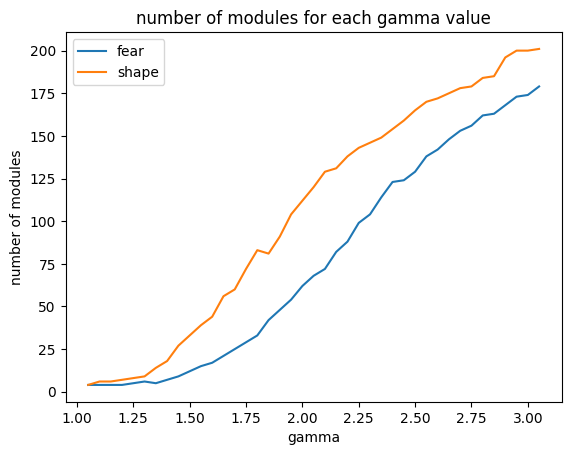

In [ ]:
plt.plot(g0, lenp0, label = 'fear')
plt.plot(g0, lenp1, label = 'shape')
plt.title("number of modules for each gamma value")
plt.xlabel("gamma")
plt.ylabel("number of modules")
plt.legend()
plt.show()

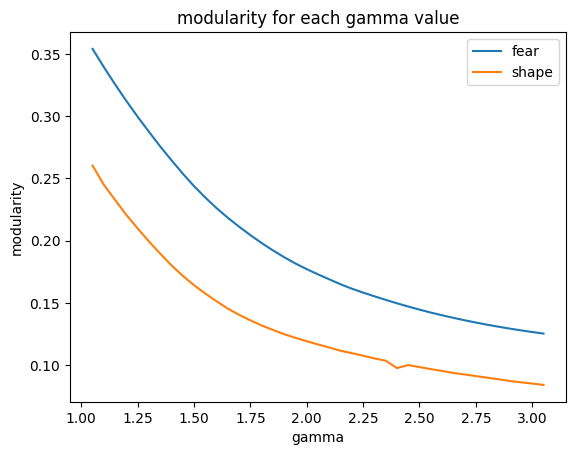

In [ ]:
plt.plot(g0, q0, label = 'fear')
plt.plot(g0, q1, label = 'shape')
plt.title("modularity for each gamma value")
plt.xlabel("gamma")
plt.ylabel("modularity")
plt.legend()
plt.show()

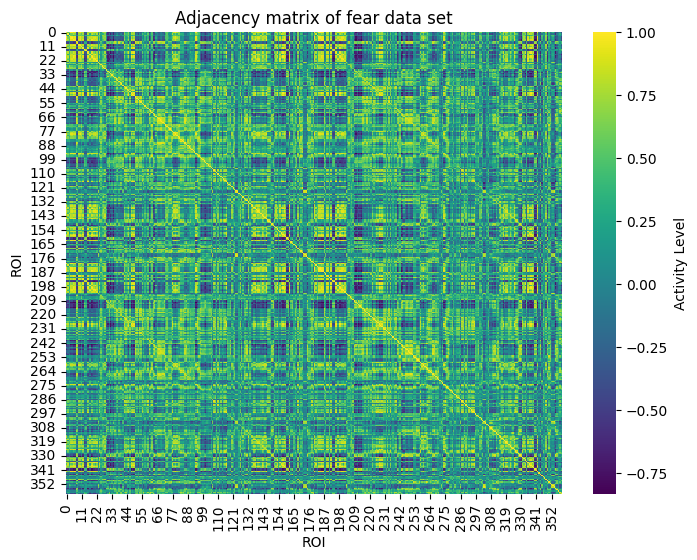

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create the heat map
plt.figure(figsize=(8, 6))
sns.heatmap(adj0, cmap="viridis", cbar_kws={'label': 'Activity Level'})

# Set titles and labels
plt.title('Adjacency matrix of fear data set')
plt.xlabel('ROI')
plt.ylabel('ROI')

# Display the heat map
plt.show()


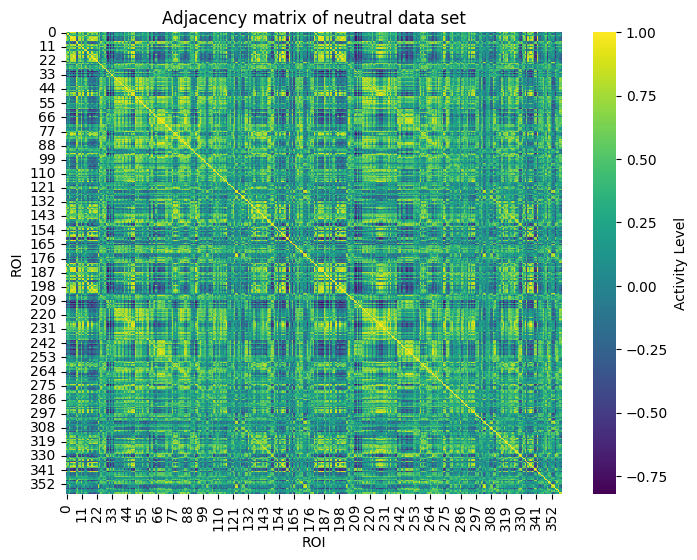

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Create the heat map
plt.figure(figsize=(8, 6))
sns.heatmap(adj1, cmap="viridis", cbar_kws={'label': 'Activity Level'})

# Set titles and labels
plt.title('Adjacency matrix of neutral data set')
plt.xlabel('ROI')
plt.ylabel('ROI')

# Display the heat map
plt.show()


Nodes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 22

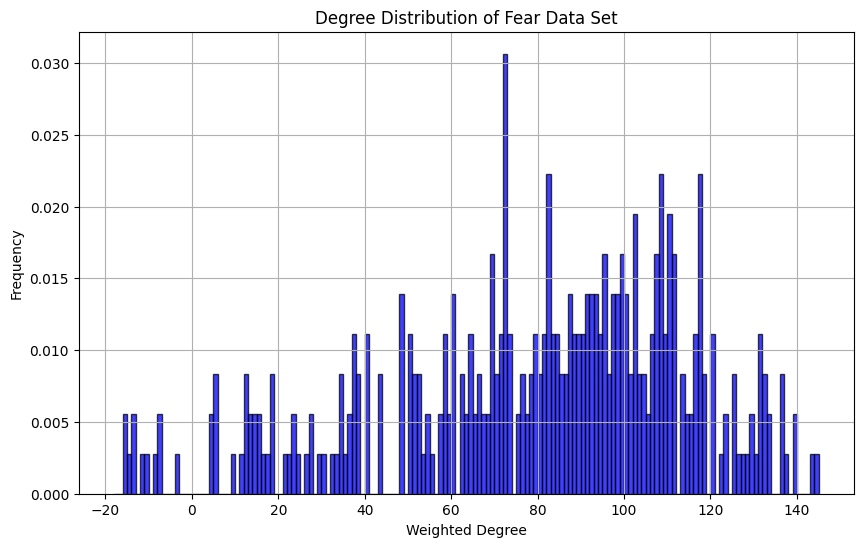

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

G = nx.from_numpy_array(adj0)


# Check if the graph is created correctly
print("Nodes:", G.nodes())
print("Edges:", G.edges())

weighted_degrees = dict(G.degree(weight='weight')).values()

# Check the weighted degrees
print("Weighted Degrees:", list(weighted_degrees))

# Plot the weighted degree distribution
plt.figure(figsize=(10, 6))
plt.hist(list(weighted_degrees), bins=range(int(min(weighted_degrees)), int(max(weighted_degrees)) + 2), density=True, alpha=0.75, color='blue', edgecolor='black')
plt.title('Degree Distribution of Fear Data Set')
plt.xlabel('Weighted Degree')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


Nodes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 22

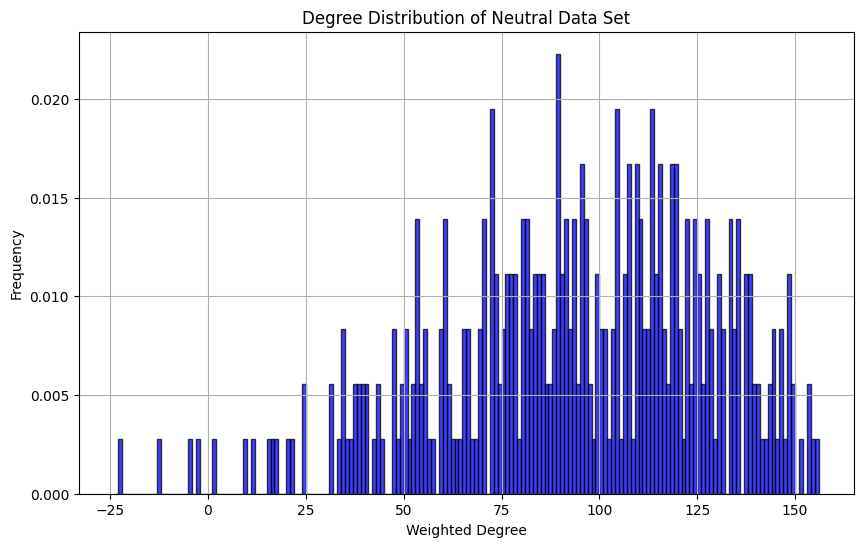

In [ ]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

G = nx.from_numpy_array(adj1)


# Check if the graph is created correctly
print("Nodes:", G.nodes())
print("Edges:", G.edges())

weighted_degrees = dict(G.degree(weight='weight')).values()

# Check the weighted degrees
print("Weighted Degrees:", list(weighted_degrees))

# Plot the weighted degree distribution
plt.figure(figsize=(10, 6))
plt.hist(list(weighted_degrees), bins=range(int(min(weighted_degrees)), int(max(weighted_degrees)) + 2), density=True, alpha=0.75, color='blue', edgecolor='black')
plt.title('Degree Distribution of Neutral Data Set')
plt.xlabel('Weighted Degree')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


#Fear

In [ ]:
plotting.view_connectome(adj0, cord, edge_threshold="99%")

#Neutral

In [ ]:
plotting.view_connectome(adj1, cord, edge_threshold="99%")

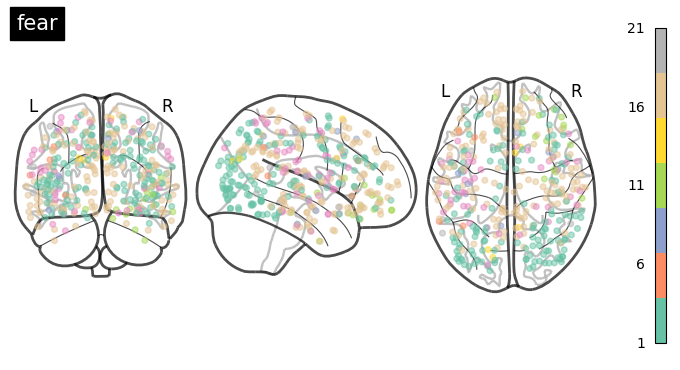

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from nilearn import plotting

best_partition = p0[9]
c = len(set(best_partition))



coordinates = cord

fig = plotting.plot_markers(node_values=p0[12], node_coords=coordinates, node_size=17, node_cmap='Set2',
                            node_threshold=None, alpha=0.5, display_mode='ortho', title= 'fear',annotate=True,
                            black_bg=False, colorbar=True, radiological=False)
plt.show()


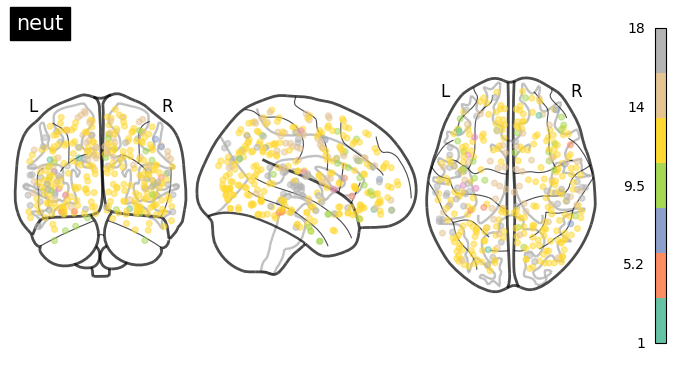

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from nilearn import plotting

best_partition = p0[9]
c = len(set(best_partition))



coordinates = cord

fig = plotting.plot_markers(node_values=p1[7], node_coords=coordinates, node_size=17, node_cmap='Set2',
                            node_threshold=None, alpha=0.5, display_mode='ortho', title= 'neut',annotate=True,
                            black_bg=False, colorbar=True, radiological=False)
plt.show()


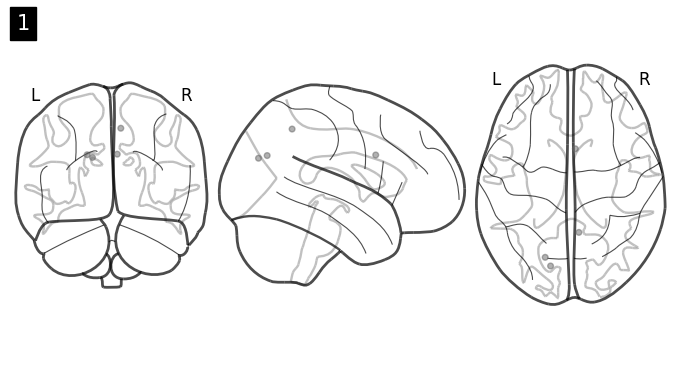

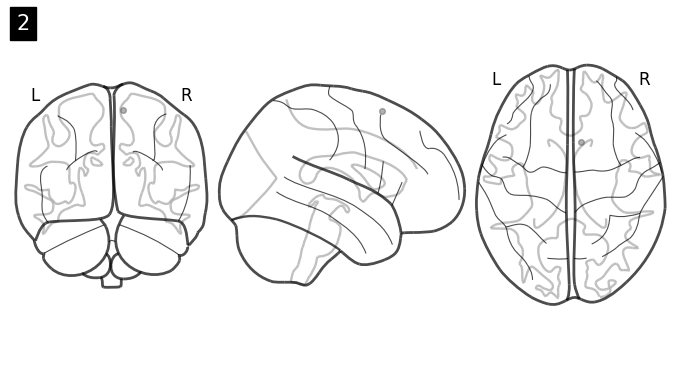

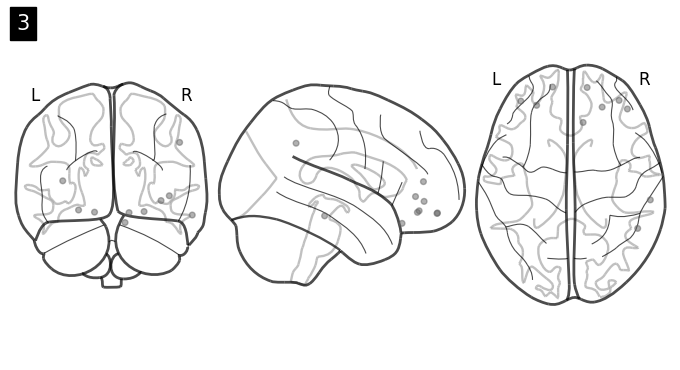

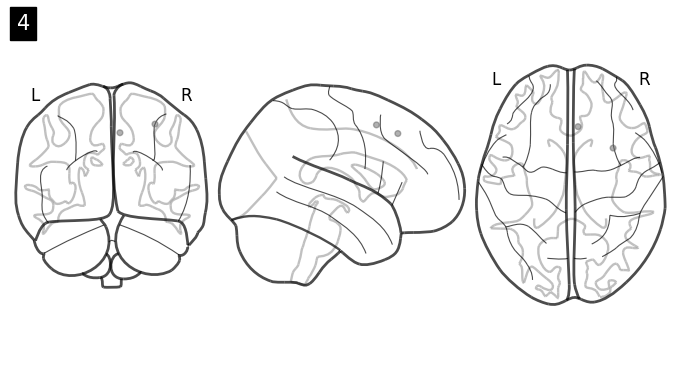

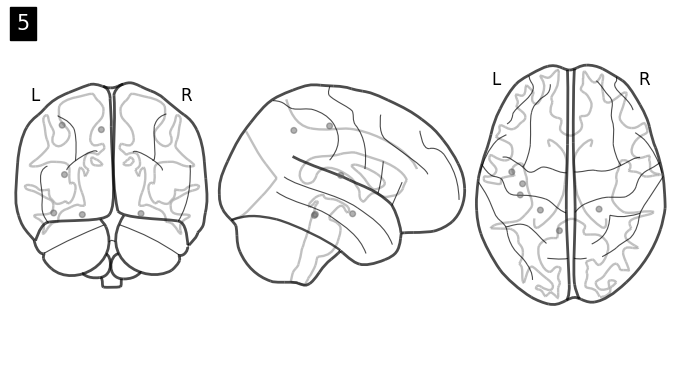

...

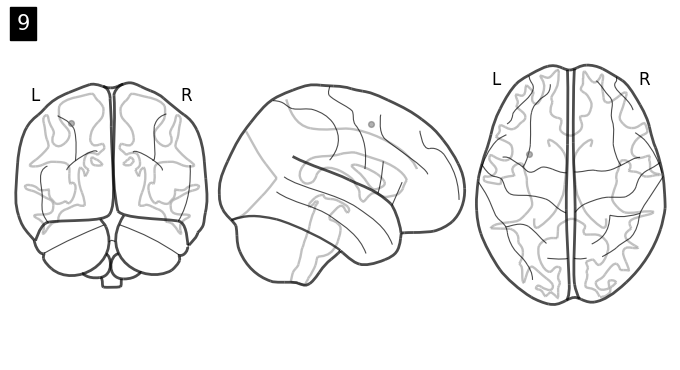

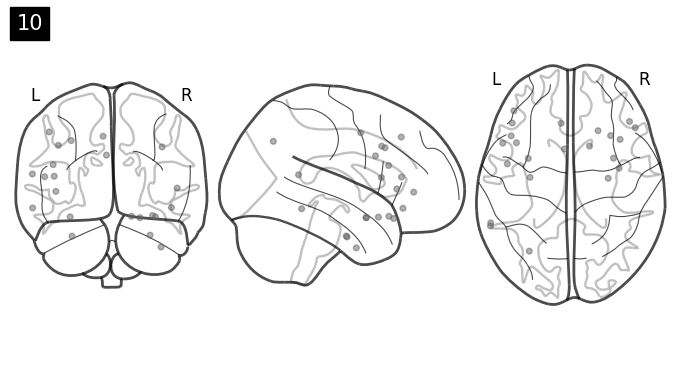

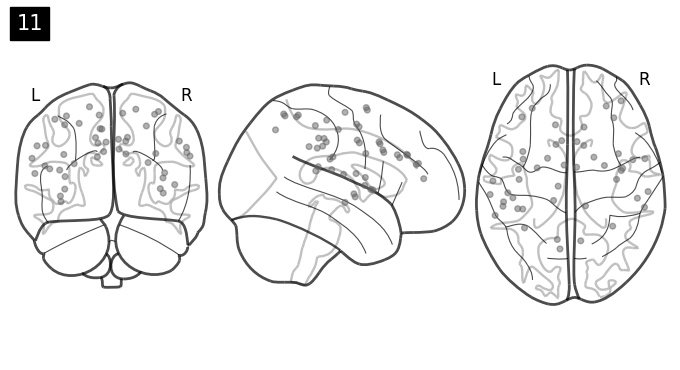

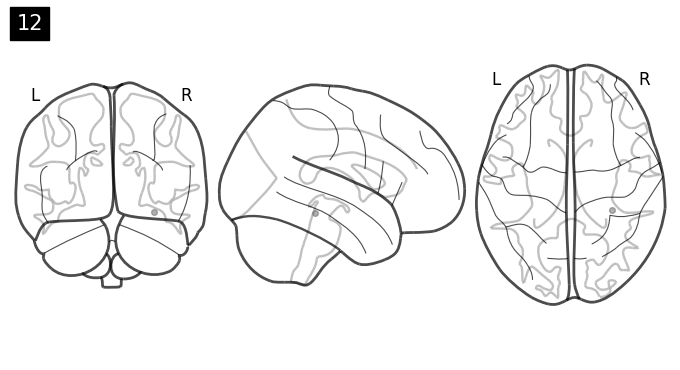

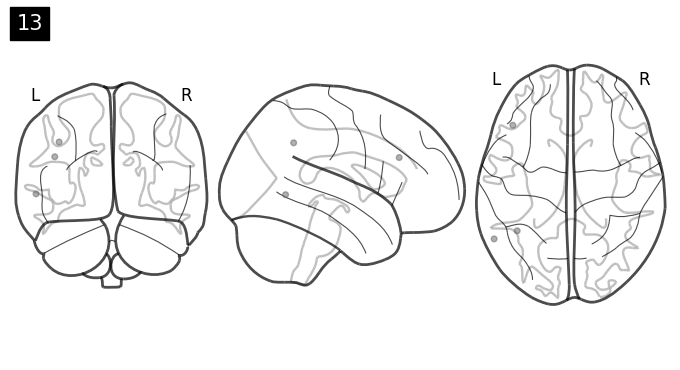

In [ ]:
color_rgb = [100,100,100]
best_partition = p0[9]
c = len(set(best_partition))
for i in range(1,c+1):
  # color_normalized = np.array(color_rgb[i-1]) / 255.0
  color_normalized = np.array(color_rgb) / 255.0
  custom_cmap = ListedColormap([color_normalized])
  loc = np.where(best_partition == i)
  module_list = best_partition[loc]
  coordinates = cord[loc]

  fig = plotting.plot_markers(node_values=module_list, node_coords=coordinates, node_size=17, node_cmap=custom_cmap,
                              node_threshold=None, alpha=0.5, display_mode='ortho', title= i, annotate=True,
                              black_bg=False, colorbar=False, radiological=False)
  plt.show()
